In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 17.5MB/s 
     |████████████████████████████████| 51kB 8.1MB/s 
     |████████████████████████████████| 194kB 60.1MB/s 
     |████████████████████████████████| 1.2MB 24.7MB/s 
     |████████████████████████████████| 61kB 10.9MB/s 
Mounted at /content/gdrive


In [ ]:
pip install azure-cognitiveservices-search-imagesearch

In [3]:
from fastbook import *
from fastai.vision.widgets import *
from utils import *

In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', 'e64e662e531842f7a26bde61cc318799')

In [5]:
plant_types = 'succulent','cactus','tree'
path = Path('plant')

In [7]:
i = 0
if not path.exists():
    path.mkdir()
    for o in plant_types:
        i = i+1
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing_many(key, f'{o}', total_count=500)
        download_images(dest, urls=results)

In [8]:
fns = get_image_files(path)
fns

(#1341) [Path('plant/cactus/00000154.jpg'),Path('plant/cactus/00000179.jpg'),Path('plant/cactus/00000102.jpg'),Path('plant/cactus/00000489.jpg'),Path('plant/cactus/00000450.jpg'),Path('plant/cactus/00000250.jpg'),Path('plant/cactus/00000426.jpg'),Path('plant/cactus/00000170.jpg'),Path('plant/cactus/00000199.JPG'),Path('plant/cactus/00000219.jpg')...]

In [9]:
failed = verify_images(fns)
failed

(#9) [Path('plant/cactus/00000134.jpeg'),Path('plant/cactus/00000368.jpg'),Path('plant/cactus/00000385.png'),Path('plant/cactus/00000331.jpg'),Path('plant/tree/00000213.jpg'),Path('plant/tree/00000282.jpg'),Path('plant/tree/00000362.jpg'),Path('plant/tree/00000162.jpg'),Path('plant/succulent/00000307.jpg')]

In [10]:
failed.map(Path.unlink);

In [23]:
plants = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

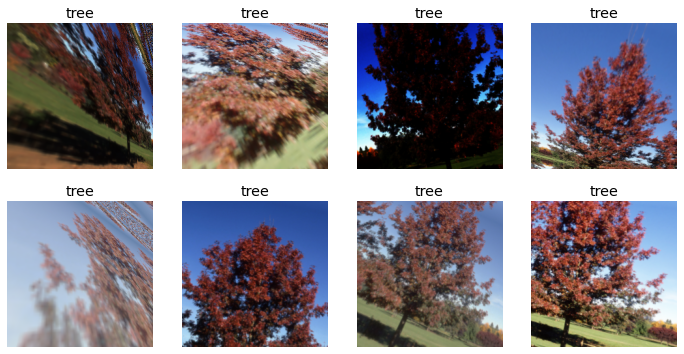

In [24]:
plants = plants.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms(mult=3))
dls = plants.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [25]:
learn = cnn_learner(dls, resnet50, metrics=error_rate)
learn.fine_tune(8)

epoch,train_loss,valid_loss,error_rate,time
0,1.253021,0.617021,0.163347,00:38


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.710465,0.393578,0.103586,00:39
1,0.704712,0.462315,0.119522,00:39
2,0.646646,0.387288,0.091633,00:38
3,0.538577,0.242172,0.079681,00:39
4,0.464535,0.254569,0.087649,00:39
5,0.396630,0.269252,0.075697,00:39
6,0.363760,0.262255,0.071713,00:40
7,0.340086,0.256513,0.075697,00:39


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

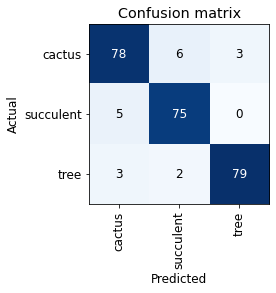

In [26]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

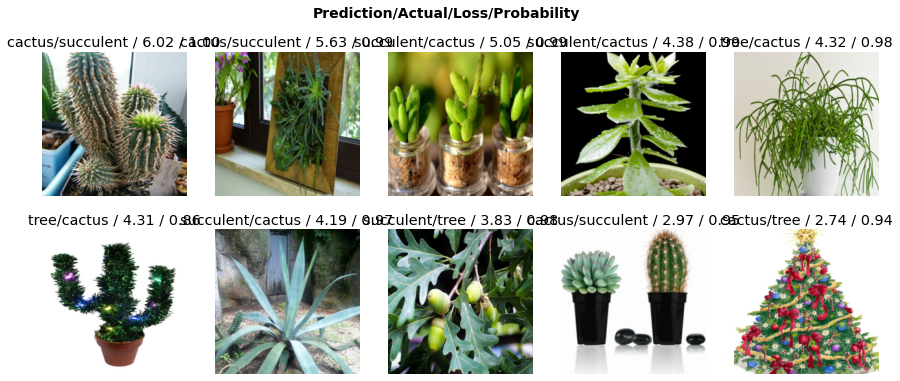

In [27]:
interp.plot_top_losses(10, nrows=2)

In [16]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [22]:
for idx in cleaner.delete(): 
    print(cleaner.fns[idx])
    cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

plant/cactus/00000299.jpg
plant/cactus/00000346.jpg
plant/cactus/00000473.jpg
plant/cactus/00000113.JPG
plant/cactus/00000418.jpg
plant/cactus/00000252.jpg
plant/cactus/00000198.JPG
plant/cactus/00000259.jpg
plant/cactus/00000087.jpg
plant/cactus/00000095.jpg
plant/cactus/00000063.jpg


In [28]:
learn.export()

In [29]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]